In [1]:
import sys, os

!{sys.executable} -m pip install -q pyvista planetary-computer pystac-client pystac stackstac

In [2]:
# display PyGMTSAR version
from pygmtsar import __version__
__version__

'2024.8.30.post3'

In [3]:
# specify GMTSAR installation path
PATH = os.environ['PATH']
if PATH.find('GMTSAR') == -1:
    PATH = os.environ['PATH'] + ':/usr/local/GMTSAR/bin/'
    %env PATH {PATH}

### Flood Detection

This is a jupyter notebook copied form the Flood (Correlation) Map example from https://github.com/AlexeyPechnikov/pygmtsar.

In [4]:
import xarray as xr
import numpy as np

import pandas as pd
import geopandas as gpd
import json

from dask.distributed import Client
import dask

In [5]:
# plotting modules
import pyvista as pv
# magic trick for white background
pv.set_plot_theme("document")
import panel
panel.extension(comms='ipywidgets')
panel.extension('vtk')
from contextlib import contextmanager
import matplotlib.pyplot as plt
@contextmanager
def mpl_settings(settings):
    original_settings = {k: plt.rcParams[k] for k in settings}
    plt.rcParams.update(settings)
    yield
    plt.rcParams.update(original_settings)
plt.rcParams['figure.figsize'] = [12, 4]
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
%matplotlib inline

In [6]:
# define Pandas display settings
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 100)

In [7]:
from pygmtsar import S1, Stack, tqdm_dask, ASF, Tiles, XYZTiles

In [8]:
SUBSWATH = 2
ORBIT = 'D'

In [9]:
def get_sar_1_collections_from(file_path):
    with open (file_path, 'r') as f:
        scenes = f.readlines()
    return [f.strip() for f in scenes]

In [10]:
SAR_1_COLLECTIONS_FILE_1 = 'data/bursts/June 2018 - July 12 2018.txt'
SAR_1_COLLECTIONS_FILE_2 = 'data/bursts/Jul 2024 - Oct 2024.txt'
SAR_1_COLLECTIONS_FILE_3 = 'data/bursts/Oct 2015 - Dec 2015.txt'
scenes = get_sar_1_collections_from(SAR_1_COLLECTIONS_FILE_3)

In [11]:
scenes

['S1_067576_IW2_20151225T214636_VH_238C-BURST',
 'S1_067576_IW2_20151225T214636_VV_238C-BURST',
 'S1_067576_IW2_20151213T214637_VH_5DF0-BURST',
 'S1_067576_IW2_20151213T214637_VV_5DF0-BURST',
 'S1_067576_IW2_20151201T214637_VH_7527-BURST',
 'S1_067576_IW2_20151201T214637_VV_7527-BURST',
 'S1_067576_IW2_20151119T214637_VH_4294-BURST',
 'S1_067576_IW2_20151119T214637_VV_4294-BURST',
 'S1_067576_IW2_20151026T214638_VH_CD30-BURST',
 'S1_067576_IW2_20151026T214638_VV_CD30-BURST',
 'S1_067576_IW2_20151014T214638_VH_E665-BURST',
 'S1_067576_IW2_20151014T214638_VV_E665-BURST',
 'S1_067576_IW2_20151002T214638_VH_D860-BURST',
 'S1_067576_IW2_20151002T214638_VV_D860-BURST']

In [12]:
SCENES = scenes

In [13]:
SCENES.reverse()

In [14]:
WORKDIR = 'raw_golden_desc'  if ORBIT == 'D' else 'raw_golden_asc'
DATADIR = 'data_golden_desc' if ORBIT == 'D' else 'data_golden_asc'
!rm -r {WORKDIR}/*
!rm -r {DATADIR}/*

In [15]:
# define DEM and landmask filenames inside data directory
DEM = f'{DATADIR}/dem.nc'

In [51]:
geojson = '''
{
  "type": "Feature",
  "geometry": {
    "type": "Point",
    "coordinates": [121.0017, 14.5361]
  },
  "properties": {}
}
'''
AOI = gpd.GeoDataFrame.from_features([json.loads(geojson)])
AOI = AOI.buffer(0.02)
AOI

0    POLYGON ((121.0217 14.5361, 121.0216 14.53414, 121.02132 14.5322, 121.02084 14.53029, 121.02018 ...
dtype: geometry

In [52]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf_username = 'mirasnickanthony'
asf_password = 'e44 4E6 E447E S56E!'

In [53]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf = ASF(asf_username, asf_password)
# Optimized scene downloading from ASF - only the required subswaths and polarizations.
print(asf.download(DATADIR, SCENES))

ASF Downloading Bursts Catalog:   0%|          | 0/1 [00:00<?, ?it/s]

ASF Downloading Sentinel-1 Bursts:   0%|          | 0/14 [00:00<?, ?it/s]

                                 burst_or_scene
0   S1_067576_IW2_20151002T214638_VV_D860-BURST
1   S1_067576_IW2_20151002T214638_VH_D860-BURST
2   S1_067576_IW2_20151014T214638_VV_E665-BURST
3   S1_067576_IW2_20151014T214638_VH_E665-BURST
4   S1_067576_IW2_20151026T214638_VV_CD30-BURST
5   S1_067576_IW2_20151026T214638_VH_CD30-BURST
6   S1_067576_IW2_20151119T214637_VV_4294-BURST
7   S1_067576_IW2_20151119T214637_VH_4294-BURST
8   S1_067576_IW2_20151201T214637_VV_7527-BURST
9   S1_067576_IW2_20151201T214637_VH_7527-BURST
10  S1_067576_IW2_20151213T214637_VV_5DF0-BURST
11  S1_067576_IW2_20151213T214637_VH_5DF0-BURST
12  S1_067576_IW2_20151225T214636_VV_238C-BURST
13  S1_067576_IW2_20151225T214636_VH_238C-BURST


In [54]:
# scan the data directory for SLC scenes and download missed orbits
S1.download_orbits(DATADIR, S1.scan_slc(DATADIR))

NOTE: Found multiple scenes for a single day, use function Stack.reframe() to stitch the scenes


Tiles Parallel Downloading:   0%|          | 0/2 [00:00<?, ?it/s]

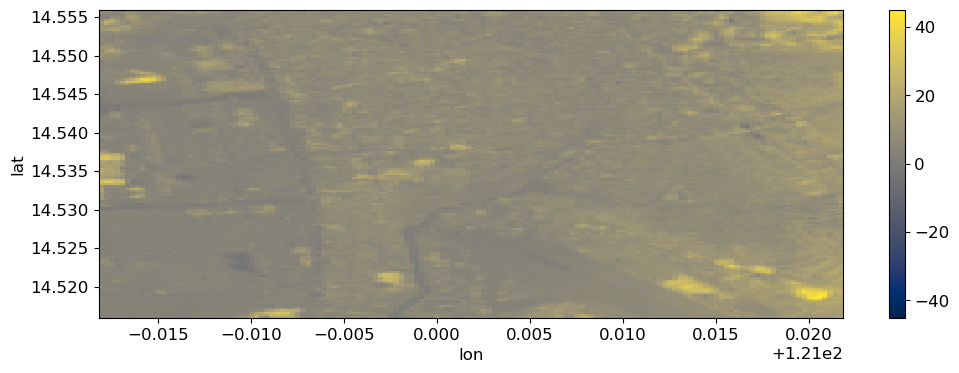

In [55]:
# download Copernicus Global DEM 1 arc-second
Tiles().download_dem(AOI, filename=DEM, skip_exist=False).plot.imshow(cmap='cividis')

In [56]:
# simple Dask initialization
if 'client' in globals():
    client.close()
client = Client()

2024-10-29 16:03:41,159 - distributed.scheduler - WARNING - Detected different `run_spec` for key ('getitem-2b3383999c71f3d9231e6a6e27094de1', 6, 0, 0) between two consecutive calls to `update_graph`. This can cause failures and deadlocks down the line. Please ensure unique key names. If you are using a standard dask collections, consider releasing all the data before resubmitting another computation. More details and help can be found at https://github.com/dask/dask/issues/9888. 
Debugging information
---------------------
old task state: waiting
old run_spec: (<function getitem at 0x7f0d92929800>, (('where-13db0dd9c9f3a6a54d41ce2d0c41cbd9', 4, 0, 0), (array([0]), slice(None, None, None), slice(None, None, None))), {})
new run_spec: (<function execute_task at 0x7f0dd5567ce0>, (('where-getitem-2b3383999c71f3d9231e6a6e27094de1', 6, 0, 0),), {})
old token: ('tuple', [('3a54a0fe35af534a', []), ('tuple', [('tuple', ['where-13db0dd9c9f3a6a54d41ce2d0c41cbd9', 4, 0, 0]), ('tuple', [('942c203a

### Select Original Scenes and Orbits

In [57]:
scenes = S1.scan_slc(DATADIR, subswath=SUBSWATH)

NOTE: Found multiple scenes for a single day, use function Stack.reframe() to stitch the scenes


In [58]:
sbas = Stack(WORKDIR, drop_if_exists=True).set_scenes(scenes)
sbas.to_dataframe()

NOTE: auto set reference scene 2015-10-02. You can change it like Stack.set_reference("2022-01-20")


,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2015-10-02,2015-10-02 21:46:38,D,S1A,VH,2,data_golden_desc/S1A_IW_SLC__1SDV_20151002T214638_20151002T214641_007979_00B288_D860.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151002T214638_20151002T214641_007979_00B288_D860.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210308T231255_V20151001T225943_20151003T005943.EOF,"MULTIPOLYGON (((121.39887 14.57326, 121.35534 14.58161, 121.31212 14.5899, 121.26918 14.59812, 1..."
2015-10-02,2015-10-02 21:46:38,D,S1A,VV,2,data_golden_desc/S1A_IW_SLC__1SDV_20151002T214638_20151002T214641_007979_00B288_D860.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151002T214638_20151002T214641_007979_00B288_D860.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210308T231255_V20151001T225943_20151003T005943.EOF,"MULTIPOLYGON (((121.39887 14.57326, 121.35534 14.58161, 121.31212 14.5899, 121.26918 14.59812, 1..."
2015-10-14,2015-10-14 21:46:38,D,S1A,VH,2,data_golden_desc/S1A_IW_SLC__1SDV_20151014T214638_20151014T214641_008154_00B738_E665.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151014T214638_20151014T214641_008154_00B738_E665.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T030545_V20151013T225943_20151015T005943.EOF,"MULTIPOLYGON (((121.39888 14.57347, 121.35535 14.58183, 121.31212 14.59011, 121.26918 14.59833, ..."
2015-10-14,2015-10-14 21:46:38,D,S1A,VV,2,data_golden_desc/S1A_IW_SLC__1SDV_20151014T214638_20151014T214641_008154_00B738_E665.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151014T214638_20151014T214641_008154_00B738_E665.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T030545_V20151013T225943_20151015T005943.EOF,"MULTIPOLYGON (((121.39888 14.57347, 121.35535 14.58183, 121.31212 14.59011, 121.26918 14.59833, ..."
2015-10-26,2015-10-26 21:46:38,D,S1A,VH,2,data_golden_desc/S1A_IW_SLC__1SDV_20151026T214638_20151026T214641_008329_00BBF7_CD30.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151026T214638_20151026T214641_008329_00BBF7_CD30.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T065536_V20151025T225943_20151027T005943.EOF,"MULTIPOLYGON (((121.39932 14.57332, 121.35579 14.58168, 121.31256 14.58996, 121.26962 14.59818, ..."
2015-10-26,2015-10-26 21:46:38,D,S1A,VV,2,data_golden_desc/S1A_IW_SLC__1SDV_20151026T214638_20151026T214641_008329_00BBF7_CD30.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151026T214638_20151026T214641_008329_00BBF7_CD30.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T065536_V20151025T225943_20151027T005943.EOF,"MULTIPOLYGON (((121.39932 14.57332, 121.35579 14.58168, 121.31256 14.58996, 121.26962 14.59818, ..."
2015-11-19,2015-11-19 21:46:37,D,S1A,VH,2,data_golden_desc/S1A_IW_SLC__1SDV_20151119T214637_20151119T214640_008679_00C57A_4294.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151119T214637_20151119T214640_008679_00C57A_4294.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T142308_V20151118T225943_20151120T005943.EOF,"MULTIPOLYGON (((121.39896 14.57375, 121.35544 14.5821, 121.31221 14.59039, 121.26928 14.59861, 1..."
2015-11-19,2015-11-19 21:46:37,D,S1A,VV,2,data_golden_desc/S1A_IW_SLC__1SDV_20151119T214637_20151119T214640_008679_00C57A_4294.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151119T214637_20151119T214640_008679_00C57A_4294.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T142308_V20151118T225943_20151120T005943.EOF,"MULTIPOLYGON (((121.39896 14.57375, 121.35544 14.5821, 121.31221 14.59039, 121.26928 14.59861, 1..."
2015-12-01,2015-12-01 21:46:37,D,S1A,VH,2,data_golden_desc/S1A_IW_SLC__1SDV_20151201T214637_20151201T214640_008854_00CA62_7527.SAFE/measur...,data_golden_desc/S1A_IW_SLC__1SDV_20151201T214637_20151201T214640_008854_00CA62_7527.SAFE/annota...,data_golden_desc/S1A_OPER_AUX_POEORB_OPOD_20210309T180138_V20151130T225943_20151202T005943.EOF,"MULTIPOLYGON (((121.39885 14.57358, 121.35532 14.5819

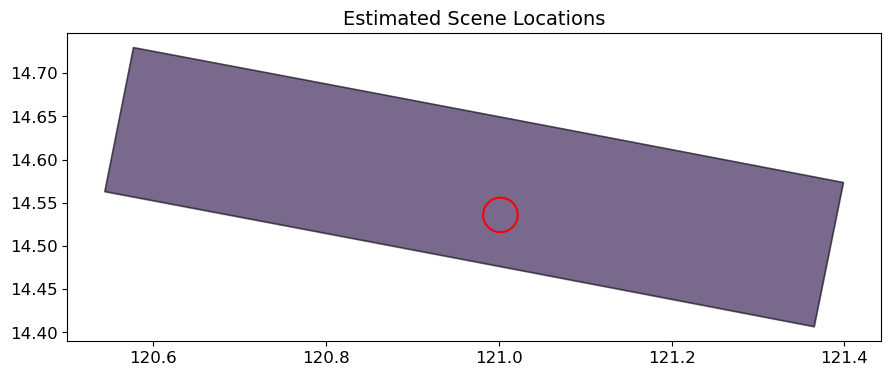

In [59]:
sbas.plot_scenes(AOI=AOI, aspect='equal')

### Reframe Scene

"Stitch sequential scenes and crop the subswath to a smaller area for faster processing when the full area is not needed."

In [60]:
sbas.compute_reframe(AOI)

Reframing:   0%|          | 0/7 [00:00<?, ?it/s]

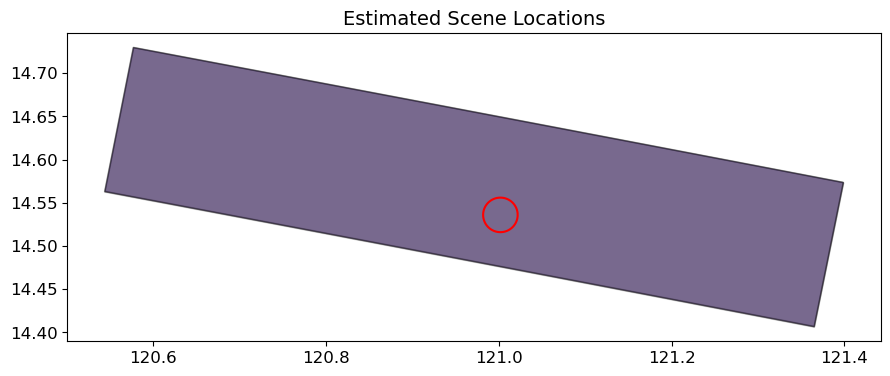

In [61]:
sbas.plot_scenes(AOI=AOI, aspect='equal')

### Load DEM

In [62]:
# define the area of interest (AOI) to speedup the processing
sbas.load_dem(DEM, AOI)

Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

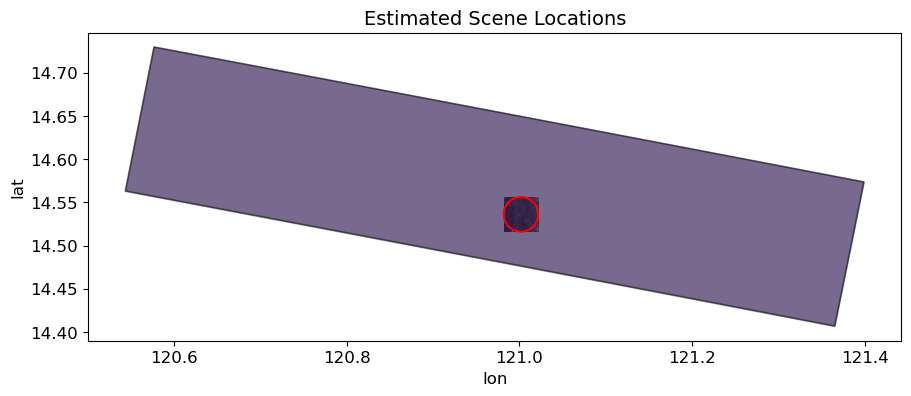

In [63]:
sbas.plot_scenes(AOI=AOI, aspect='equal')

In [64]:
sbas.compute_align()

Aligning Reference:   0%|          | 0/1 [00:00<?, ?it/s]

Aligning Repeat:   0%|          | 0/6 [00:00<?, ?it/s]

Convert Subswath:   0%|          | 0/7 [00:00<?, ?it/s]

In [65]:
sbas.compute_geocode(1)

Radar Transform Computing:   0%|          | 0/1 [00:00<?, ?it/s]

Radar Transform Saving:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Radar Transform Indexing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Radar Inverse Transform Computing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Satellite Look Vector Computing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

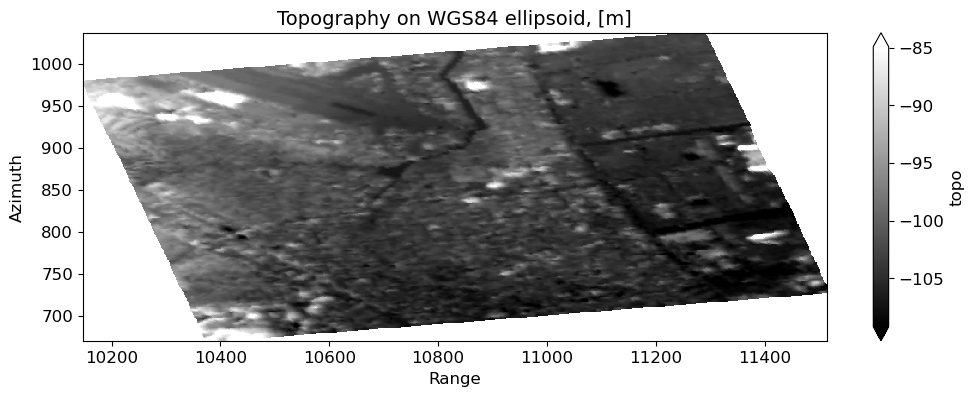

In [66]:
sbas.plot_topo(quantile=[0.01, 0.99])
plt.savefig('plots/Topography in Radar Coordinates.jpg')

### Persistent Scatterers Function (PSF)

In [67]:
# use the only selected dates for the pixels stability analysis
sbas.compute_ps()

Intensity Normalization:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

Compute Stability Measures:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/opt/conda/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


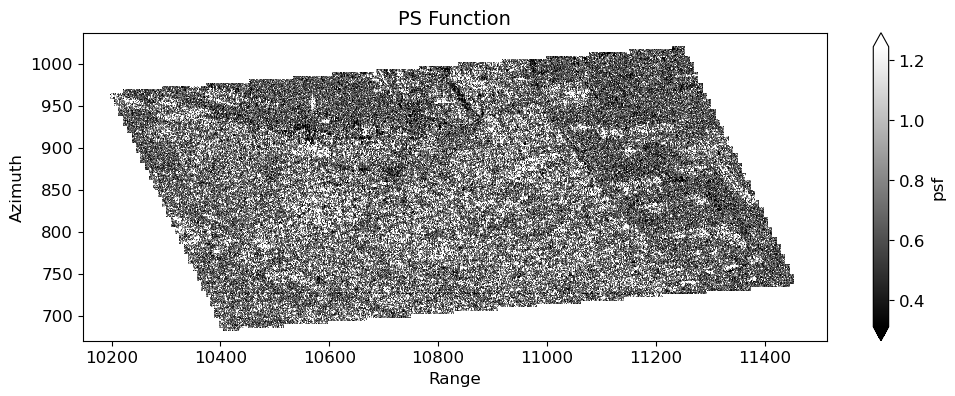

In [68]:
sbas.plot_psfunction(quantile=[0.01, 0.90])

In [69]:
baseline_pairs = sbas.sbas_pairs(days=24)
# optionally, drop dates having less then 2 pairs
#baseline_pairs = sbas.sbas_pairs_limit(baseline_pairs, limit=2, iterations=2)
# optionally, drop all pairs connected to the specified dates
#baseline_pairs = sbas.sbas_pairs_filter_dates(baseline_pairs, ['2021-01-01'])
baseline_pairs

,ref,rep,ref_baseline,rep_baseline,pair,baseline,duration,rel
0,2015-10-02,2015-10-14,-0.00,19.08,2015-10-02 2015-10-14,19.08,12,NaT
1,2015-10-02,2015-10-26,-0.00,-16.78,2015-10-02 2015-10-26,-16.78,24,NaT
2,2015-10-14,2015-10-26,19.08,-16.78,2015-10-14 2015-10-26,-35.86,12,NaT
3,2015-10-26,2015-11-19,-16.78,2.02,2015-10-26 2015-11-19,18.80,24,NaT
4,2015-11-19,2015-12-01,2.02,39.02,2015-11-19 2015-12-01,37.00,12,NaT
5,2015-11-19,2015-12-13,2.02,84.93,2015-11-19 2015-12-13,82.91,24,NaT
6,2015-12-01,2015-12-13,39.02,84.93,2015-12-01 2015-12-13,45.91,12,NaT
7,2015-12-01,2015-12-25,39.02,45.80,2015-12-01 2015-12-25,6.78,24,NaT
8,2015-12-13,2015-12-25,84.93,45.80,2015-12-13 2015-12-25,-39.13,12,NaT


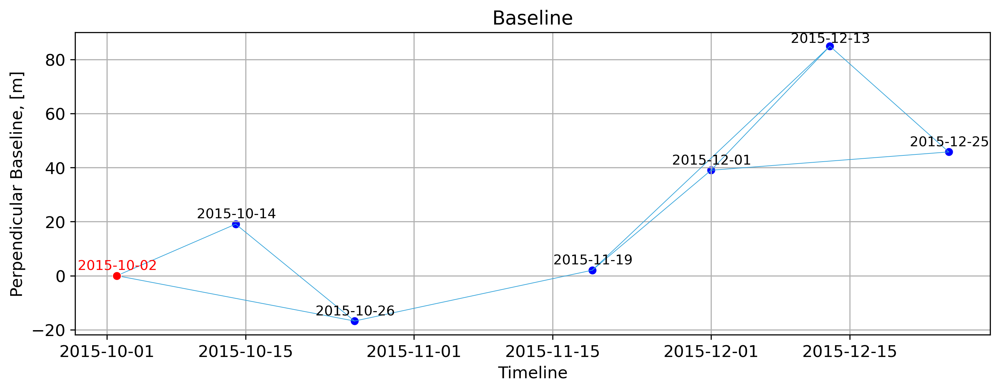

In [70]:
with mpl_settings({'figure.dpi': 300}):
    sbas.plot_baseline(baseline_pairs)

### Global Surface Water Mask

<xarray.DataArray 'landmask' (lat: 144, lon: 144)> Size: 21kB
dask.array<gt, shape=(144, 144), dtype=bool, chunksize=(144, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 1kB 14.52 14.52 14.52 14.52 ... 14.56 14.56 14.56
  * lon      (lon) float64 1kB 121.0 121.0 121.0 121.0 ... 121.0 121.0 121.0

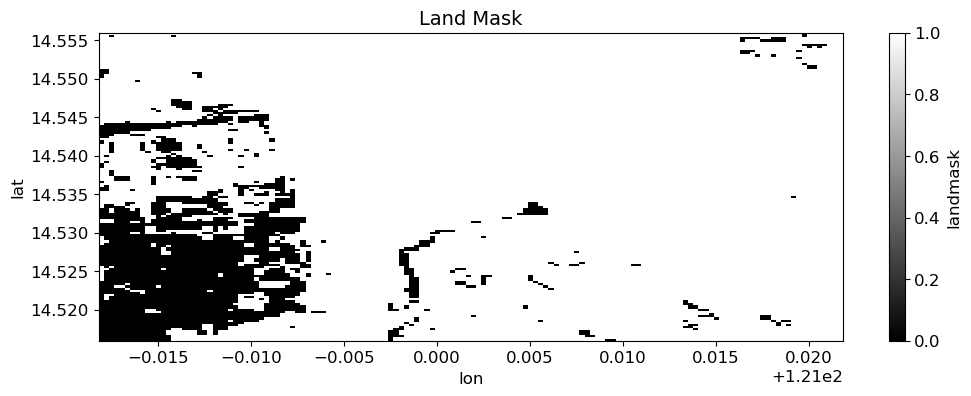

In [71]:
sbas.set_landmask(None)
sbas.load_landmask('recurrence_120E_20Nv1_4_2021.tif')
landmask = (sbas.get_landmask()*-1)>-0.02
sbas.set_landmask(None)
sbas.plot_landmask(landmask)
landmask

In [72]:
landmask.to_dataframe()

landmask
lat       lon                 
14.516111 120.981944     False
          120.982222     False
          120.982500     False
          120.982778     False
          120.983056     False
...                        ...
14.555833 121.020556      True
          121.020833      True
          121.021111      True
          121.021389      True
          121.021667      True

[20736 rows x 1 columns]

In [73]:
landmask_ra = sbas.ll2ra(landmask)
landmask_ra

<xarray.DataArray 'landmask' (y: 183, x: 171)> Size: 125kB
dask.array<from-value, shape=(183, 171), dtype=float32, chunksize=(183, 171), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 1kB 671.5 673.5 675.5 ... 1.032e+03 1.034e+03 1.036e+03
  * x        (x) float64 1kB 1.015e+04 1.016e+04 ... 1.15e+04 1.151e+04

In [74]:
landmask_ra.to_dataframe()

landmask
y      x                
671.5  10151.5       NaN
       10159.5       NaN
       10167.5       NaN
       10175.5       NaN
       10183.5       NaN
...                  ...
1035.5 11479.5       NaN
       11487.5       NaN
       11495.5       NaN
       11503.5       NaN
       11511.5       NaN

[31293 rows x 1 columns]

In [75]:
# load radar topography
topo = sbas.get_topo()
# load Sentinel-1 data
data = sbas.open_data()

### SBAS Interferogram

Here, we calculate the phase difference with topography correction. The blue areas in the plot are the presence of flood detected from backscatter, calculated from ...

In [76]:
WAVELENGTH = 30
COARSEN_GRID = (1,4)

In [77]:
sbas.compute_interferogram_multilook(
    baseline_pairs,
    'intf_mlook',
    wavelength=WAVELENGTH,
    phase=sbas.phasediff(baseline_pairs, data, topo),
    coarsen=COARSEN_GRID
)

Saving Interferogram 1...9 from 9:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/opt/conda/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/opt/conda/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [78]:
ds_sbas = sbas.open_stack('intf_mlook')
ds_sbas = ds_sbas.where(landmask_ra.interp_like(ds_sbas, method='nearest'))
intf_sbas = ds_sbas.phase
corr_sbas = ds_sbas.correlation
corr_sbas

<xarray.DataArray 'correlation' (pair: 9, y: 367, x: 341)> Size: 5MB
dask.array<where, shape=(9, 367, 341), dtype=float32, chunksize=(1, 367, 341), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 72B 2015-10-02 2015-10-02 ... 2015-12-13
    rep      (pair) datetime64[ns] 72B 2015-10-14 2015-10-26 ... 2015-12-25
  * pair     (pair) <U21 756B '2015-10-02 2015-10-14' ... '2015-12-13 2015-12...
  * y        (y) float64 3kB 670.5 671.5 672.5 ... 1.034e+03 1.036e+03 1.036e+03
  * x        (x) float64 3kB 1.015e+04 1.015e+04 ... 1.15e+04 1.151e+04

In [80]:
# geocode
corr_ll_sbas = sbas.ra2ll(corr_sbas)
corr_ll_sbas

<xarray.DataArray 'correlation' (pair: 9, lat: 308, lon: 285)> Size: 3MB
dask.array<concatenate, shape=(9, 308, 285), dtype=float32, chunksize=(1, 308, 285), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 2kB 14.52 14.52 14.52 14.52 ... 14.56 14.56 14.56
  * lon      (lon) float64 2kB 121.0 121.0 121.0 121.0 ... 121.0 121.0 121.0
    ref      (pair) datetime64[ns] 72B 2015-10-02 2015-10-02 ... 2015-12-13
    rep      (pair) datetime64[ns] 72B 2015-10-14 2015-10-26 ... 2015-12-25
  * pair     (pair) <U21 756B '2015-10-02 2015-10-14' ... '2015-12-13 2015-12...

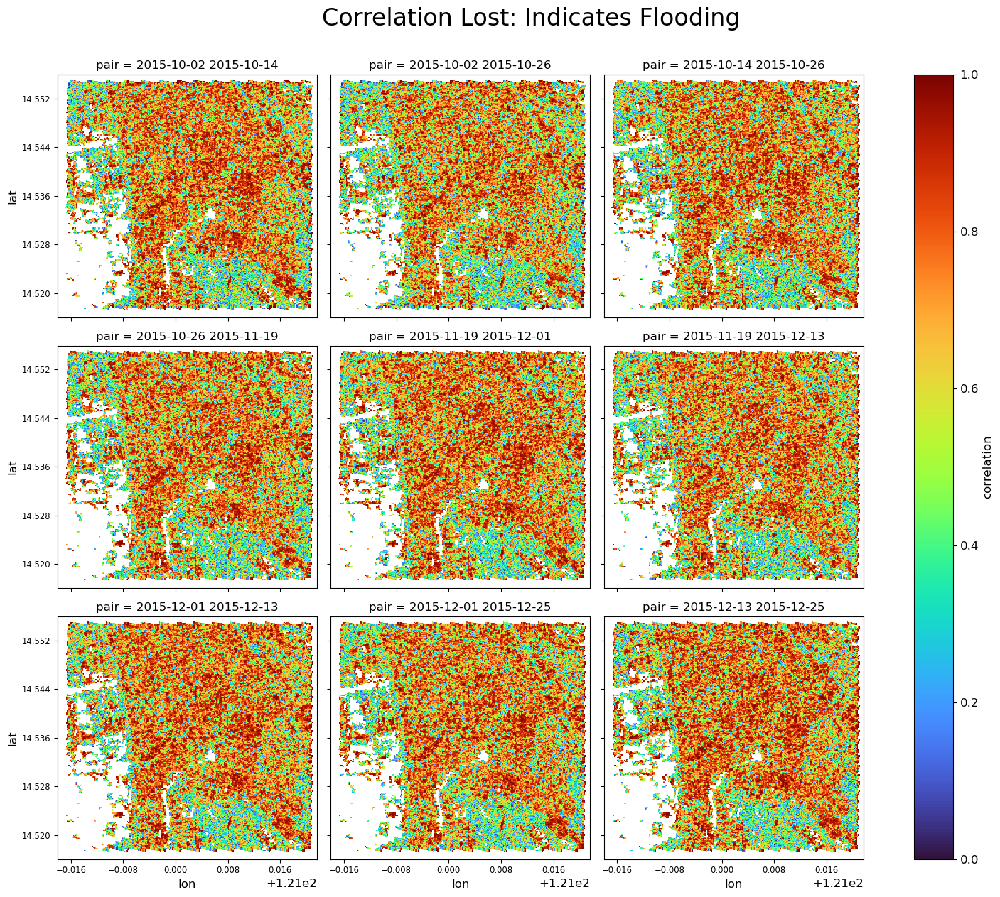

In [81]:
sbas.plot_correlations(corr_ll_sbas.where(corr_ll_sbas)[:9], cols=3, cmap='turbo', caption='Correlation Lost: Indicates Flooding')

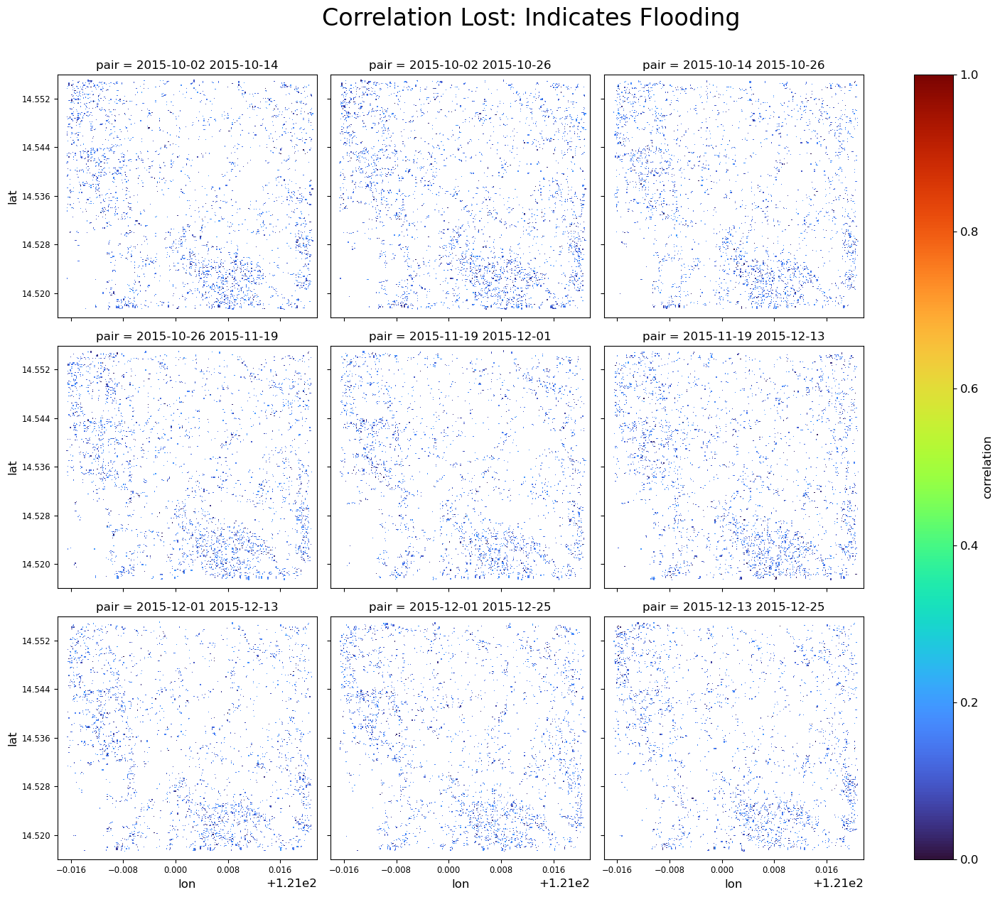

In [82]:
sbas.plot_correlations(corr_ll_sbas.where(corr_ll_sbas<0.2)[:9], cols=3, cmap='turbo', caption='Correlation Lost: Indicates Flooding')

In [83]:
disp_sbas = sbas.los_displacement_mm(sbas.lstsq(intf_sbas, corr_sbas))

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


In [84]:
# optionally, materialize to disk and open
disp_sbas = sbas.sync_cube(disp_sbas, 'disp_sbas')
disp_sbas

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [118]:
disp_sbas_mean = disp_sbas.mean(['y', 'x'])

In [85]:
corr_sbas_lstsq = sbas.lstsq(corr_sbas)
corr_sbas_lstsq

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


<xarray.DataArray 'displacement' (date: 7, y: 367, x: 341)> Size: 4MB
dask.array<concatenate, shape=(7, 367, 341), dtype=float32, chunksize=(7, 256, 256), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 56B 2015-10-02 2015-10-14 ... 2015-12-25
  * y        (y) float64 3kB 670.5 671.5 672.5 ... 1.034e+03 1.036e+03 1.036e+03
  * x        (x) float64 3kB 1.015e+04 1.015e+04 ... 1.15e+04 1.151e+04

In [86]:
corr_sbas_lstsq = sbas.sync_cube(corr_sbas_lstsq, 'corr_sbas_lstsq')
corr_sbas_lstsq

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [106]:
corr_sbas_lstsq_mean = corr_sbas_lstsq.mean(['y', 'x'])

In [88]:
disp_sbas_stl = sbas.stl(disp_sbas)

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


In [89]:
disp_sbas_stl = sbas.sync_cube(disp_sbas_stl, 'disp_sbas_stl')

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [90]:
corr_sbas_stl = sbas.stl(corr_sbas_lstsq)

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


In [91]:
corr_sbas_stl = sbas.sync_cube(corr_sbas_stl, 'corr_sbas_stl')

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [92]:
corr_sbas_stl

<xarray.Dataset> Size: 18MB
Dimensions:   (date: 12, y: 367, x: 341)
Coordinates:
  * date      (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20
  * y         (y) float64 3kB 670.5 671.5 672.5 ... 1.036e+03 1.036e+03
  * x         (x) float64 3kB 1.015e+04 1.015e+04 ... 1.15e+04 1.151e+04
Data variables:
    trend     (date, y, x) float32 6MB dask.array<chunksize=(1, 367, 341), meta=np.ndarray>
    seasonal  (date, y, x) float32 6MB dask.array<chunksize=(1, 367, 341), meta=np.ndarray>
    resid     (date, y, x) float32 6MB dask.array<chunksize=(1, 367, 341), meta=np.ndarray>

In [103]:
corr_sbas_stl_mean = corr_sbas_stl.mean(['y', 'x'])
corr_sbas_stl_mean

<xarray.Dataset> Size: 240B
Dimensions:   (date: 12)
Coordinates:
  * date      (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20
Data variables:
    trend     (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>
    seasonal  (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>
    resid     (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>

In [93]:
corr_sbas_stl_seasonal_mean = corr_sbas_stl.seasonal.mean(['y', 'x'])
corr_sbas_stl_seasonal_mean

<xarray.DataArray 'seasonal' (date: 12)> Size: 48B
dask.array<mean_agg-aggregate, shape=(12,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20

In [94]:
corr_sbas_stl_trend_mean = corr_sbas_stl.trend.mean(['y', 'x'])
corr_sbas_stl_trend_mean

<xarray.DataArray 'trend' (date: 12)> Size: 48B
dask.array<mean_agg-aggregate, shape=(12,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20

In [95]:
disp_sbas_stl_trend_mean = disp_sbas_stl.trend.mean(['y', 'x'])
disp_sbas_stl_trend_mean

<xarray.DataArray 'trend' (date: 12)> Size: 48B
dask.array<mean_agg-aggregate, shape=(12,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20

In [101]:
disp_sbas_stl_mean = disp_sbas_stl.mean(['y', 'x'])
disp_sbas_stl_mean

<xarray.Dataset> Size: 240B
Dimensions:   (date: 12)
Coordinates:
  * date      (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20
Data variables:
    trend     (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>
    seasonal  (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>
    resid     (date) float32 48B dask.array<chunksize=(1,), meta=np.ndarray>

In [102]:
disp_sbas_stl_seasonal_mean = disp_sbas_stl.seasonal.mean(['y', 'x'])
disp_sbas_stl_seasonal_mean

<xarray.DataArray 'seasonal' (date: 12)> Size: 48B
dask.array<mean_agg-aggregate, shape=(12,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20

In [97]:
mean_lstsq_corr = corr_sbas_lstsq.mean(['y', 'x'])
mean_lstsq_corr

<xarray.DataArray 'displacement' (date: 7)> Size: 28B
dask.array<mean_agg-aggregate, shape=(7,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 56B 2015-10-02 2015-10-14 ... 2015-12-25

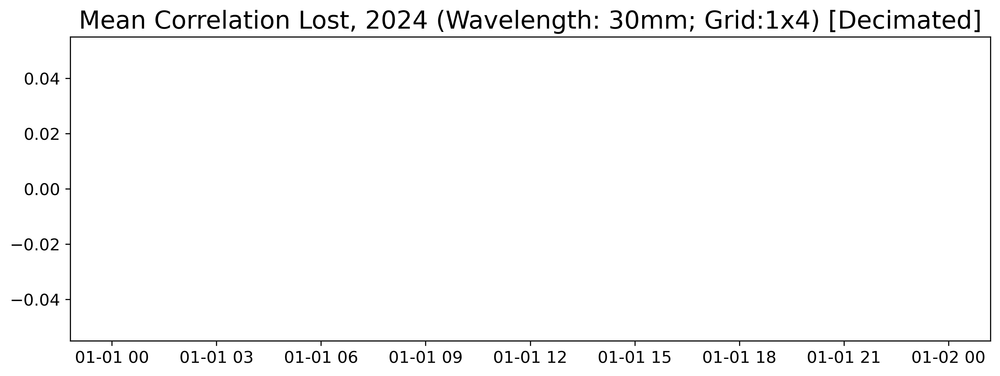

<Figure size 1200x400 with 0 Axes>

In [92]:
title = 'Mean Correlation Lost, 2024 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(mean_corr[14:25].rep, mean_corr[14:25], c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

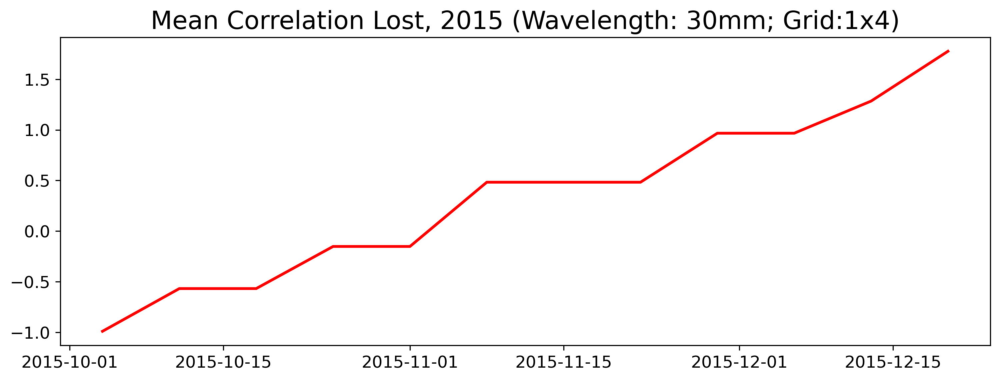

<Figure size 1200x400 with 0 Axes>

In [98]:
title = 'Mean Correlation Lost, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_sbas_stl_seasonal_mean.date, corr_sbas_stl_seasonal_mean, c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

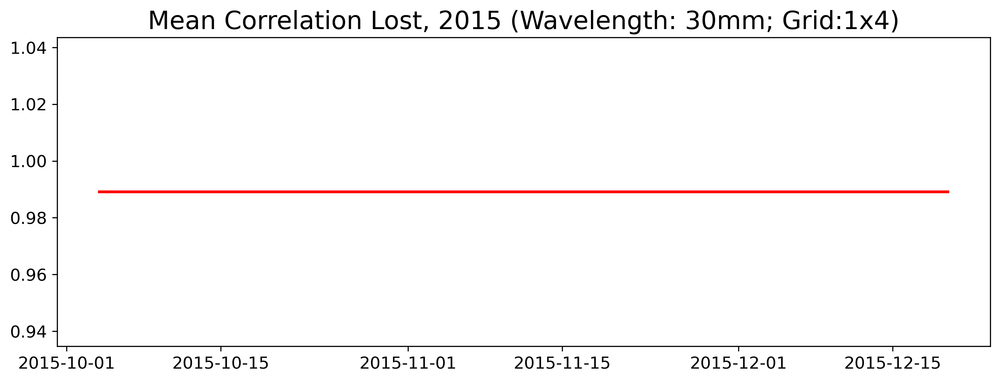

<Figure size 1200x400 with 0 Axes>

In [99]:
title = 'Mean Correlation Lost, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_sbas_stl_trend_mean.date, corr_sbas_stl_trend_mean, c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

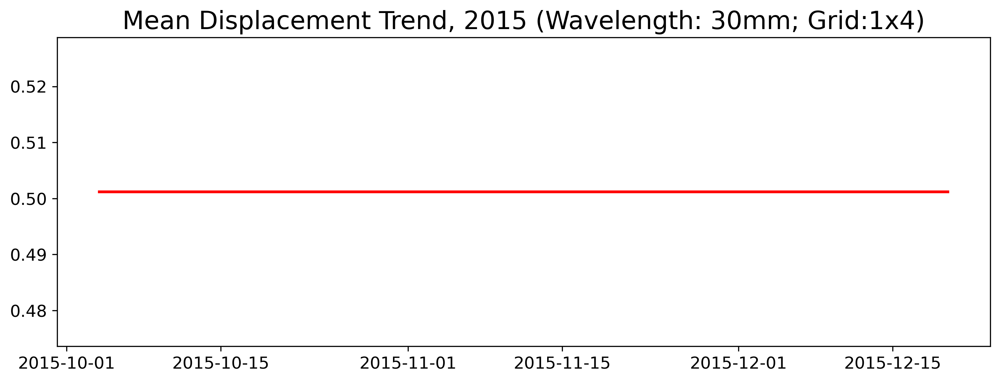

<Figure size 1200x400 with 0 Axes>

In [121]:
title = 'Mean Displacement Trend, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(disp_sbas_stl_trend_mean.date, disp_sbas_stl_trend_mean, c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

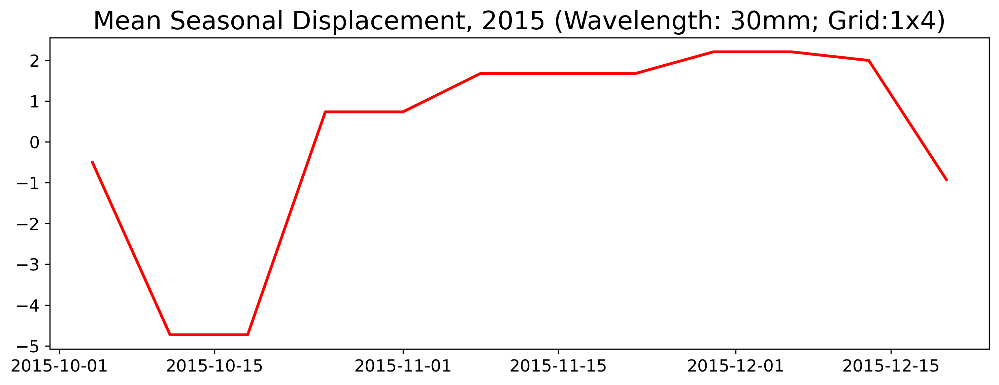

<Figure size 1200x400 with 0 Axes>

In [122]:
title = 'Mean Seasonal Displacement, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(disp_sbas_stl_seasonal_mean.date, disp_sbas_stl_seasonal_mean, c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

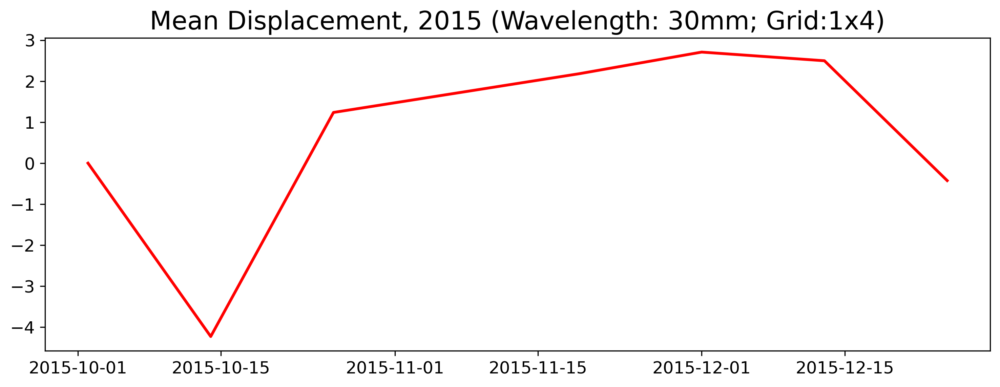

<Figure size 1200x400 with 0 Axes>

In [120]:
title = 'Mean Displacement, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(disp_sbas_mean.date, disp_sbas_mean, c='r', lw=2, label='Displacement POI')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

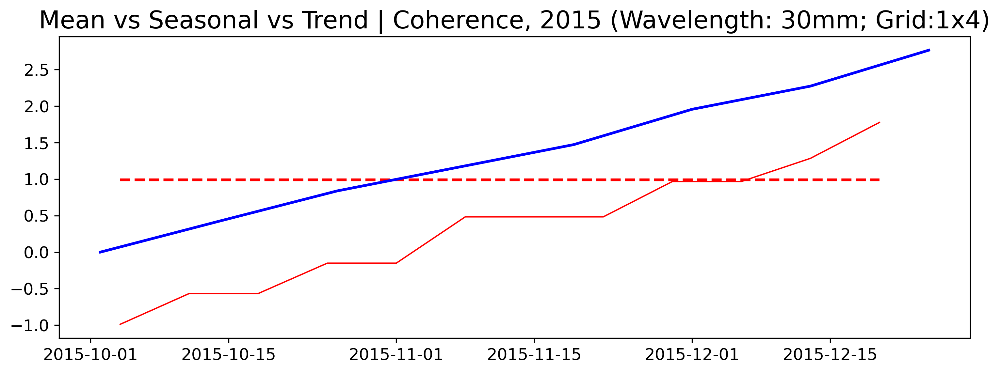

<Figure size 1200x400 with 0 Axes>

In [115]:
title = 'Mean vs Seasonal vs Trend | Coherence, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_sbas_stl_seasonal_mean.date, corr_sbas_stl_seasonal_mean, c='r', lw=1, label='Seasonal Coherence Vs Coherence Trend')
plt.plot(corr_sbas_stl_trend_mean.date, corr_sbas_stl_trend_mean, c='r', lw=2, ls='--', label='Seasonal Coherence Vs Coherence Trend')
plt.plot(corr_sbas_lstsq_mean.date, corr_sbas_lstsq_mean, c='b', lw=2, label='Mean Coherence')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

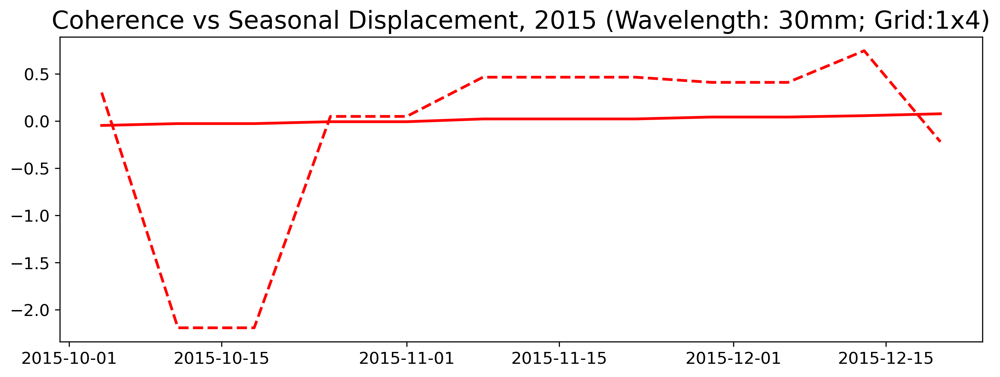

<Figure size 1200x400 with 0 Axes>

In [124]:
title = 'Mean Coherence vs Seasonal Displacement, 2015 (Wavelength: 30mm; Grid:1x4)'
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_sbas_stl_mean.date, corr_sbas_stl_mean, c='r', lw=2, label='Coherence Lost')
plt.plot(disp_sbas_stl_seasonal_mean.date, disp_sbas_stl_seasonal_mean, c='r', lw=2, ls='--',label='Seasonal Displacement')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

In [116]:
wtf = corr_sbas_lstsq - disp_sbas_stl
wtf

<xarray.Dataset> Size: 24MB
Dimensions:   (date: 1, y: 1179, x: 1713)
Coordinates:
  * date      (date) datetime64[ns] 8B 2015-12-13
  * y         (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.176e+03 1.178e+03 1.178e+03
  * x         (x) float64 14kB 7.269e+03 7.273e+03 ... 1.411e+04 1.412e+04
Data variables:
    trend     (date, y, x) float32 8MB dask.array<chunksize=(1, 1179, 1713), meta=np.ndarray>
    seasonal  (date, y, x) float32 8MB dask.array<chunksize=(1, 1179, 1713), meta=np.ndarray>
    resid     (date, y, x) float32 8MB dask.array<chunksize=(1, 1179, 1713), meta=np.ndarray>

In [115]:
wtf_mean = wtf.mean(['y', 'x'])
wtf_mean

<xarray.DataArray (date: 1)> Size: 4B
dask.array<mean_agg-aggregate, shape=(1,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 8B 2015-12-13

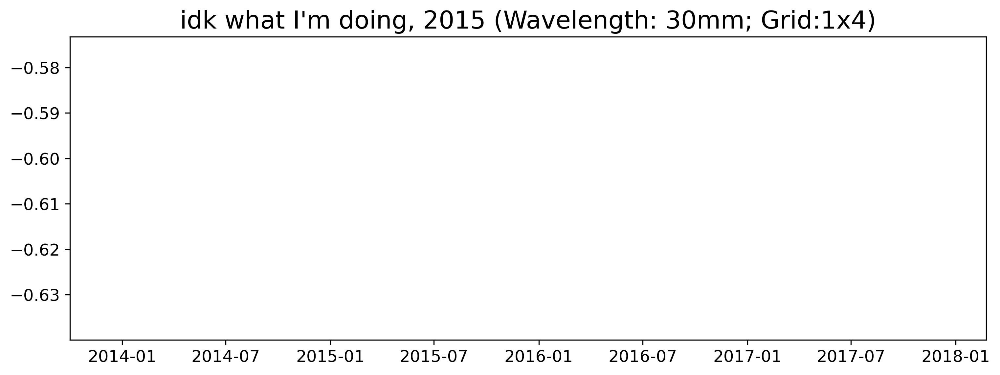

<Figure size 1200x400 with 0 Axes>

In [112]:
title = "idk what I'm doing, 2015 (Wavelength: 30mm; Grid:1x4)"
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(wtf.date, wtf, c='r', lw=2, label='WTF')
plt.title(title, fontsize=18)
plt.show()
plt.savefig(title + '.jpg')

In [137]:
sbas.stl(corr_sbas_landmasked)

AssertionError: The first data dimension should be date

In [110]:
plt.figure(figsize=(12, 4), dpi=300)

x, y = [(aoi.x, aoi.y) for aoi in AOI][0]
disp_pixel = disp_sbas.sel(y=y, x=x, method='nearest')
stl_pixel = sbas.stl(disp_sbas.sel(y=[y], x=[x], method='nearest')).isel(x=0, y=0)
plt.plot(disp_pixel.date, disp_pixel, c='r', lw=2, label='Displacement POI')
plt.plot(stl_pixel.date, stl_pixel.trend, c='r', ls='--', lw=2, label='Trend POI')
plt.plot(stl_pixel.date, stl_pixel.seasonal, c='r', lw=1, label='Seasonal POI')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=14)
plt.title('SBAS LOS Displacement STL Decompose, 2021', fontsize=18)
plt.ylabel('Displacement, mm', fontsize=16)
plt.show()

AttributeError: 'Polygon' object has no attribute 'x'

<Figure size 3600x1200 with 0 Axes>

### PS Interferogram

In [36]:
landmask_ps = landmask_ra.interp_like(sbas.psfunction(), method='nearest')
landmask_ps

<xarray.DataArray 'landmask' (y: 1179, x: 6852)> Size: 32MB
dask.array<chunked_aware_interpnd, shape=(1179, 6852), dtype=float32, chunksize=(1179, 6852), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.176e+03 1.178e+03 1.178e+03
  * x        (x) float64 55kB 7.268e+03 7.268e+03 ... 1.412e+04 1.412e+04

In [39]:
sbas.compute_interferogram_singlelook(
    baseline_pairs,
    'intf_slook',
    wavelength=30,
    weight=sbas.psfunction().where(landmask_ps),
    phase=sbas.phasediff(baseline_pairs, data, topo),
)

Saving Interferogram 1...9 from 9:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [40]:
# optionally, materialize to disk and open
ds_ps = sbas.open_stack('intf_slook')
intf_ps = ds_ps.phase
corr_ps = ds_ps.correlation

In [41]:
# compute together because correlation depends on phase, and filtered phase depends on correlation.
tqdm_dask(result := dask.persist(corr_ps, intf_ps), desc='Compute Phase and Correlation')
# unpack results for a single interferogram
corr, intf = [grid[0] for grid in result]

Compute Phase and Correlation:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

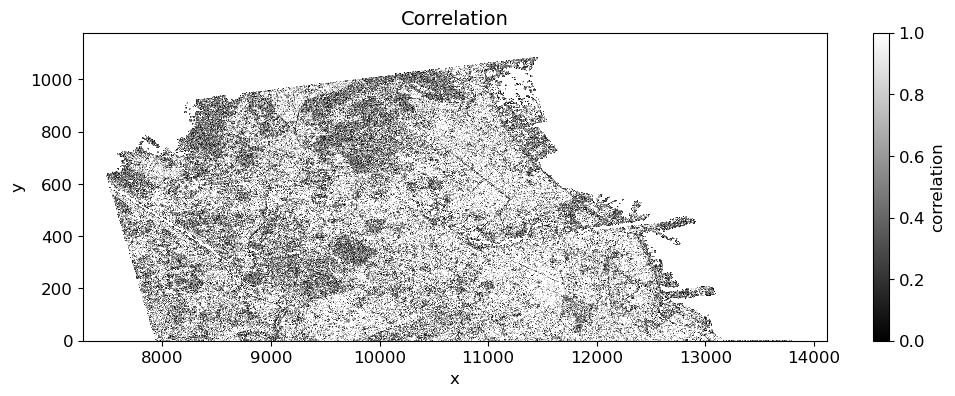

In [42]:
sbas.plot_correlation(corr)

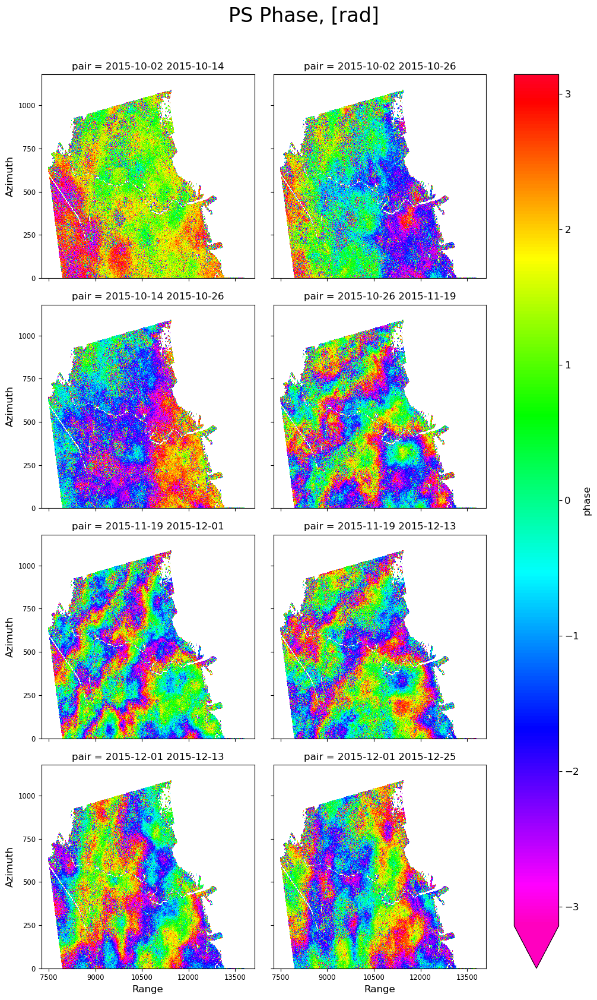

In [41]:
sbas.plot_interferograms(intf_ps[:8], caption='PS Phase, [rad]', cols=2)

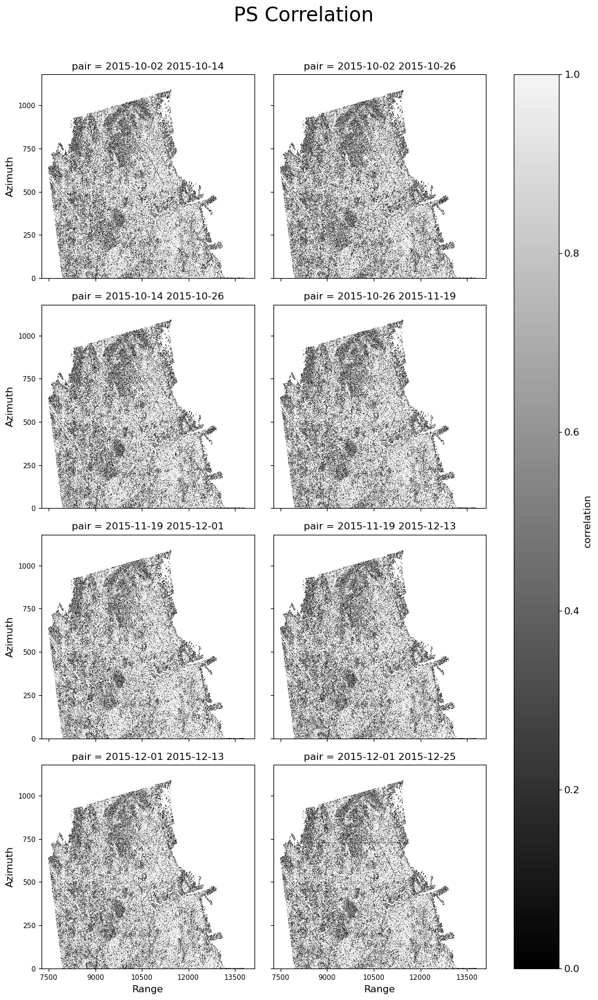

In [42]:
sbas.plot_correlations(corr_ps[:8], caption='PS Correlation', cols=2)

In [43]:
disp_ps_pairs = sbas.los_displacement_mm(sbas.unwrap1d(intf_ps))

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


In [44]:
disp_ps_pairs

<xarray.DataArray 'los' (pair: 9, y: 1179, x: 6852)> Size: 291MB
dask.array<multiply, shape=(9, 1179, 6852), dtype=float32, chunksize=(9, 256, 256), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 72B dask.array<chunksize=(9,), meta=np.ndarray>
    rep      (pair) datetime64[ns] 72B dask.array<chunksize=(9,), meta=np.ndarray>
  * pair     (pair) <U21 756B '2015-10-02 2015-10-14' ... '2015-12-13 2015-12...
  * y        (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.176e+03 1.178e+03 1.178e+03
  * x        (x) float64 55kB 7.268e+03 7.268e+03 ... 1.412e+04 1.412e+04

In [45]:
# optionally, materialize to disk and open
disp_ps_pairs = sbas.sync_cube(disp_ps_pairs, 'disp_ps_pairs')

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [46]:
ps_lstsq = sbas.lstsq(disp_ps_pairs, corr_ps)
ps_lstsq

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


<xarray.DataArray 'displacement' (date: 7, y: 1179, x: 6852)> Size: 226MB
dask.array<concatenate, shape=(7, 1179, 6852), dtype=float32, chunksize=(7, 256, 256), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 56B 2015-10-02 2015-10-14 ... 2015-12-25
  * y        (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.176e+03 1.178e+03 1.178e+03
  * x        (x) float64 55kB 7.268e+03 7.268e+03 ... 1.412e+04 1.412e+04

In [47]:
# optionally, materialize to disk and open
ps_lstsq = sbas.sync_cube(ps_lstsq, 'ps_lstsq')

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

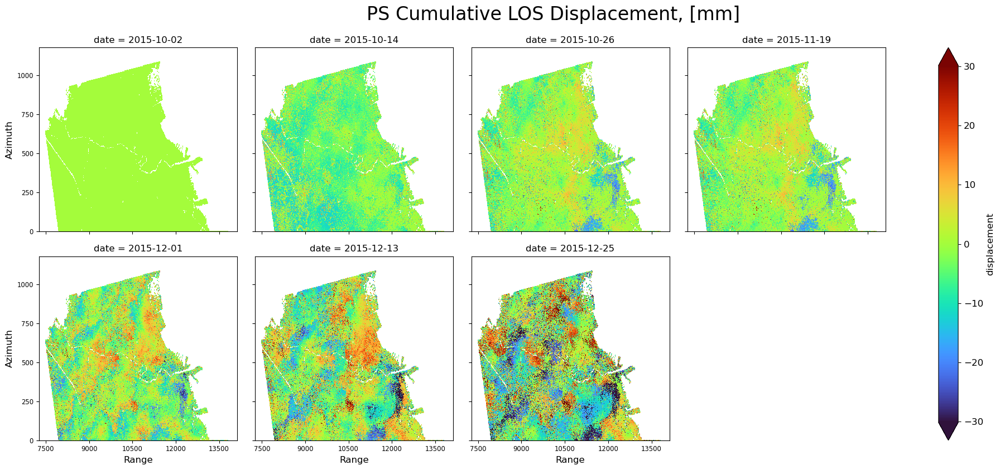

In [48]:
sbas.plot_displacements(ps_lstsq, caption='PS Cumulative LOS Displacement, [mm]',
                        quantile=[0.01, 0.99], symmetrical=True)

In [52]:
stl = sbas.stl(ps_lstsq)
stl

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


<xarray.Dataset> Size: 1GB
Dimensions:   (date: 12, y: 1179, x: 6852)
Coordinates:
  * date      (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20
  * y         (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.176e+03 1.178e+03 1.178e+03
  * x         (x) float64 55kB 7.268e+03 7.268e+03 ... 1.412e+04 1.412e+04
Data variables:
    trend     (date, y, x) float32 388MB dask.array<chunksize=(12, 256, 256), meta=np.ndarray>
    seasonal  (date, y, x) float32 388MB dask.array<chunksize=(12, 256, 256), meta=np.ndarray>
    resid     (date, y, x) float32 388MB dask.array<chunksize=(12, 256, 256), meta=np.ndarray>

In [58]:
stl = sbas.sync_cube(stl, 'stl')

Syncing NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [53]:
corr_ps_thresholded = corr_ps<0.02

In [57]:
corr_lstsq_1 = sbas.lstsq(corr_ps)
corr_lstsq_1

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


KeyboardInterrupt: 

In [56]:
corr_lstsq = sbas.lstsq(corr_ps)
corr_lstsq

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


KeyboardInterrupt: 

In [ ]:
corr_lstsq = sbas.sync_cube(corr_lstsq, 'corr_lstsq')

In [50]:
corr_ps_thresholded = corr_ps<0.02
corr_ps_mean = corr_ps_thresholded.mean(['y', 'x'])
corr_ps_mean

<xarray.DataArray 'correlation' (pair: 9)> Size: 72B
dask.array<mean_agg-aggregate, shape=(9,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 72B 2015-10-02 2015-10-02 ... 2015-12-13
    rep      (pair) datetime64[ns] 72B 2015-10-14 2015-10-26 ... 2015-12-25
  * pair     (pair) <U21 756B '2015-10-02 2015-10-14' ... '2015-12-13 2015-12...

In [61]:
ps_lstsq_mean = stl.seasonal.mean(['y', 'x'])
ps_lstsq_mean

<xarray.DataArray 'seasonal' (date: 12)> Size: 48B
dask.array<mean_agg-aggregate, shape=(12,), dtype=float32, chunksize=(12,), chunktype=numpy.ndarray>
Coordinates:
  * date     (date) datetime64[ns] 96B 2015-10-04 2015-10-11 ... 2015-12-20

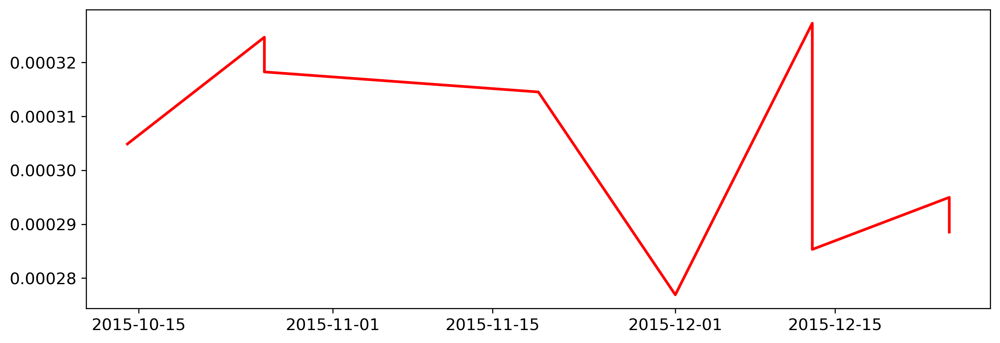

In [63]:
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_ps_mean.rep, corr_ps_mean, c='r', lw=2, label='Mean Correlation')
plt.show()

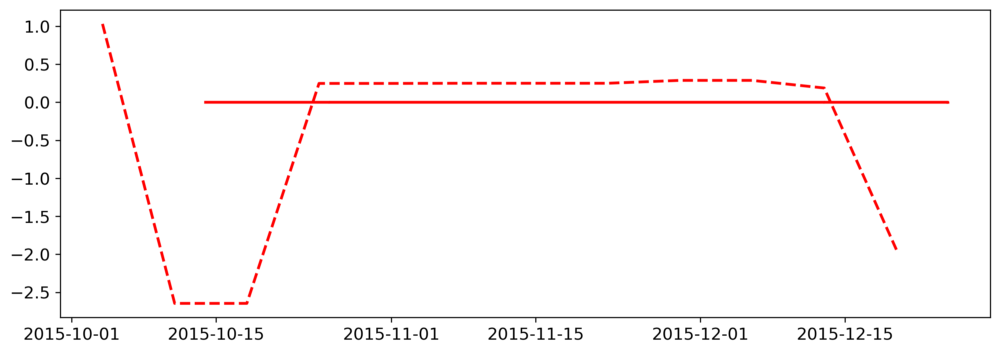

In [62]:
plt.figure(figsize=(12, 4), dpi=300)

plt.plot(corr_ps_mean.rep, corr_ps_mean, c='r', lw=2, label='Mean Correlation')
plt.plot(ps_lstsq_mean.date, ps_lstsq_mean, c='r', ls='--', lw=2, label='Trend')
plt.show()

In [ ]:
corrected_

In [134]:
# geocode
corr_ll_ps = sbas.ra2ll(corr_ps_landmasked)
corr_ll_ps

<xarray.DataArray 'correlation' (pair: 9, lat: 1549, lon: 5708)> Size: 318MB
dask.array<concatenate, shape=(9, 1549, 5708), dtype=float32, chunksize=(1, 1549, 2048), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 12kB 14.51 14.51 14.51 14.51 ... 14.71 14.71 14.71
  * lon      (lon) float64 46kB 120.9 120.9 120.9 120.9 ... 121.1 121.1 121.1
    ref      (pair) datetime64[ns] 72B 2015-10-02 2015-10-02 ... 2015-12-13
    rep      (pair) datetime64[ns] 72B 2015-10-14 2015-10-26 ... 2015-12-25
  * pair     (pair) <U21 756B '2015-10-02 2015-10-14' ... '2015-12-13 2015-12...

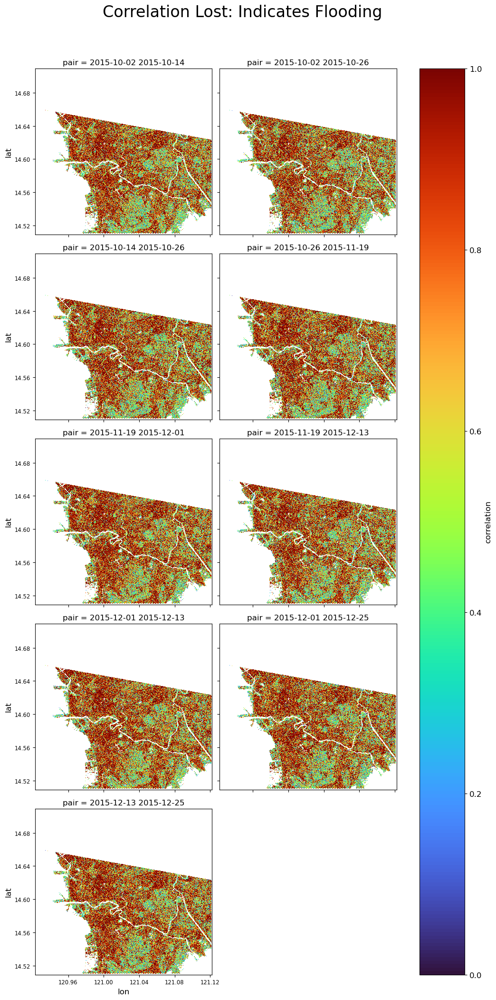

In [135]:
sbas.plot_correlations(corr_ll_ps.where(corr_ll_ps), cols=2, cmap='turbo', caption='Correlation Lost: Indicates Flooding')

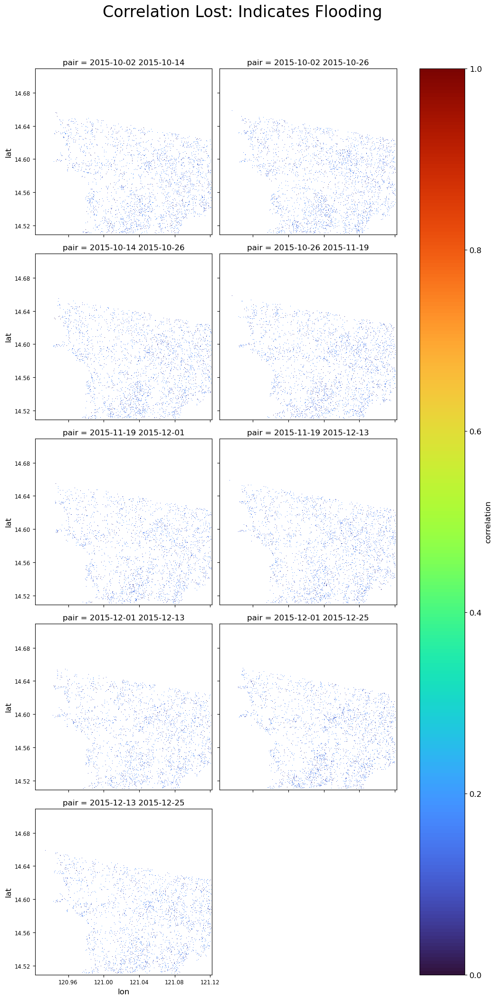

In [136]:
sbas.plot_correlations(corr_ll_ps.where(corr_ll_ps<0.2), cols=2, cmap='turbo', caption='Correlation Lost: Indicates Flooding')

### Inferegrams From M. Chini Et Al.

In [ ]:
WAVELENGTH = 100

In [ ]:
intensity = sbas.multilooking(np.square(np.abs(data)), wavelength=WAVELENGTH, coarsen=(1,4))

In [ ]:
phase = sbas.phasediff(baseline_pairs, data, topo=0)
phase15m = sbas.multilooking(phase, wavelength=100, coarsen=(1,4))
corr15m = sbas.correlation(phase15m, intensity)
phase15m_goldstein = sbas.goldstein(phase15m, corr15m, 32)
intf15m = sbas.interferogram(phase15m_goldstein)

# Conclusion